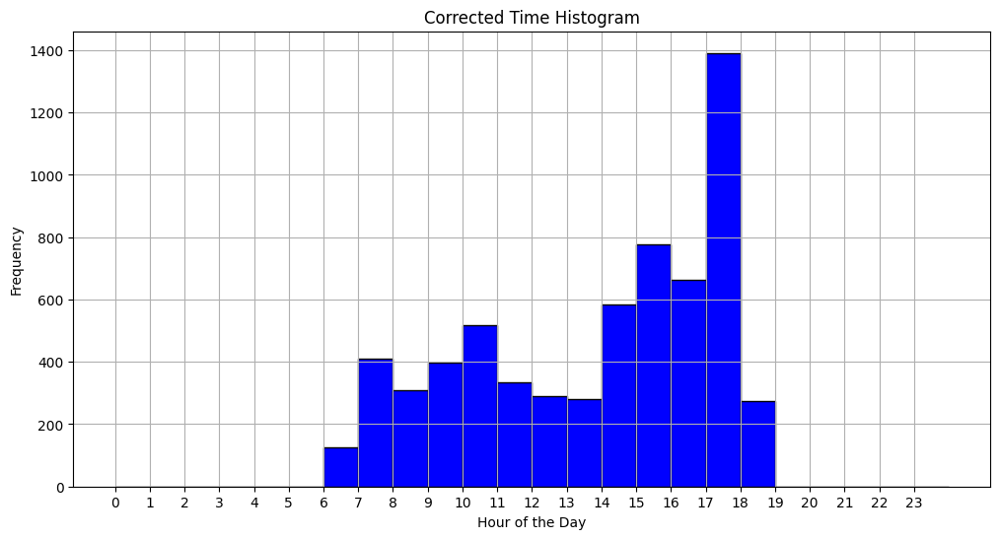

In [34]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your CSV
df = pd.read_csv("labels_train_cleaned.csv")

# Standardize to datetime (handling hh:mm and hh:mm:ss)
def parse_time(t):
    for fmt in ('%H:%M', '%H:%M:%S'):
        try:
            return pd.to_datetime(t, format=fmt)
        except:
            continue
    return pd.NaT  # Not a valid time

df['parsed_time'] = df['timestamp'].apply(parse_time)

# Add 12 hours to times where hour < 6 (assume PM)
def correct_early_hour(t):
    if pd.isna(t):
        return t
    if t.hour < 6:
        return t + pd.Timedelta(hours=12)
    return t

df['corrected_time'] = df['parsed_time'].apply(correct_early_hour)

# Format back to hh:mm in 24-hour
df['timestamp'] = df['corrected_time'].dt.strftime('%H:%M')

# Plot histogram of the corrected times
df['hour'] = df['corrected_time'].dt.hour
plt.figure(figsize=(12, 6))
plt.hist(df['hour'].dropna(), bins=range(0, 25), color='blue', edgecolor='black')
plt.title('Corrected Time Histogram')
plt.xlabel('Hour of the Day')
plt.ylabel('Frequency')
plt.xticks(range(0, 24))
plt.grid(True)
plt.show()

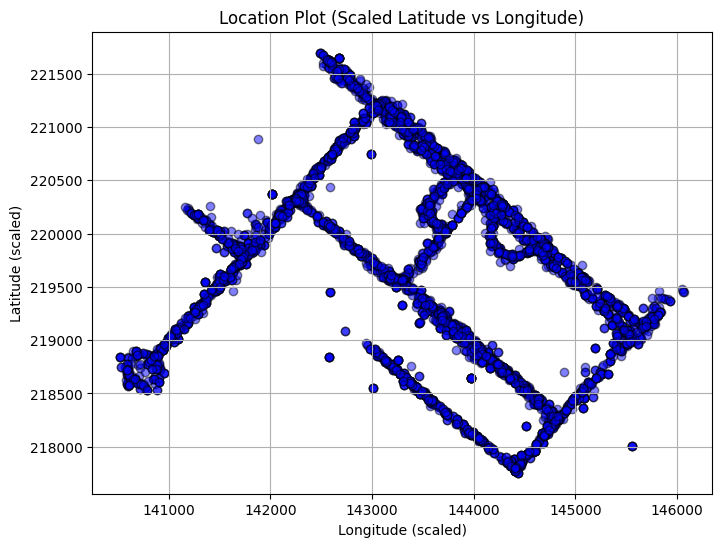

In [35]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your CSV
df = df

# Scatter plot of scaled locations
plt.figure(figsize=(8, 6))
plt.scatter(df['longitude'], df['latitude'], c='blue', alpha=0.5, edgecolors='k')
plt.title('Location Plot (Scaled Latitude vs Longitude)')
plt.xlabel('Longitude (scaled)')
plt.ylabel('Latitude (scaled)')
plt.grid(True)
plt.show()

In [36]:
to_remove_images = ['img_2887.jpg','img_2946.png','img_0096.png' ]
df = df[~df['filename'].isin(to_remove_images)]

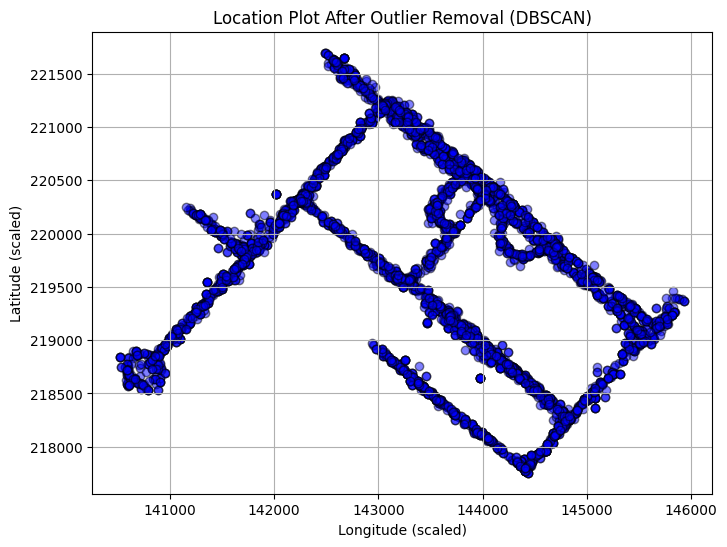

In [37]:
from sklearn.cluster import DBSCAN
import numpy as np
import matplotlib.pyplot as plt

# Extract relevant features
X = df[['latitude', 'longitude']].values

# Run DBSCAN
db = DBSCAN(eps=100, min_samples=5).fit(X)
df['cluster'] = db.labels_

# Filter out noise (outliers labeled -1)
df_dbscan = df[df['cluster'] != -1]

# Plot cleaned data
plt.figure(figsize=(8, 6))
plt.scatter(df_dbscan['longitude'], df_dbscan['latitude'], c='blue', alpha=0.5, edgecolors='k')
plt.title('Location Plot After Outlier Removal (DBSCAN)')
plt.xlabel('Longitude (scaled)')
plt.ylabel('Latitude (scaled)')
plt.grid(True)
plt.show()

In [38]:
import pandas as pd

# Assuming you already have a DataFrame named df
df_dbscan.to_csv('labels_train_cleaned_latlong.csv', index=False)

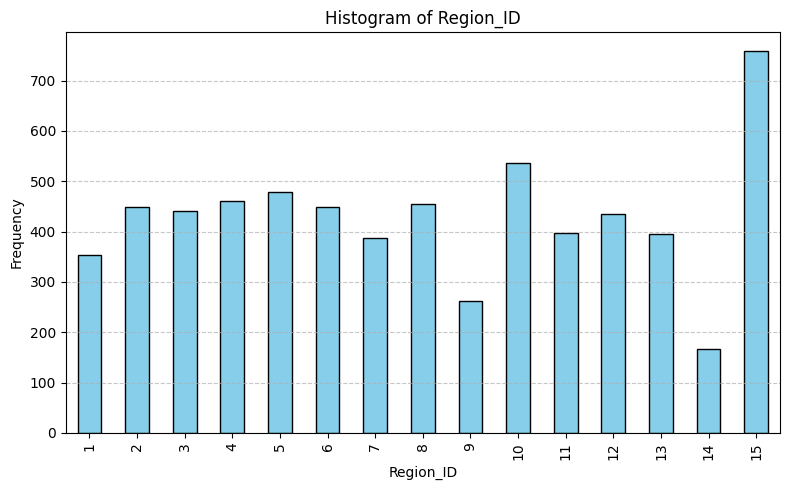

In [39]:
data = df_dbscan

# Plot histogram for Region_ID
plt.figure(figsize=(8, 5))
data['Region_ID'].value_counts().sort_index().plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Histogram of Region_ID')
plt.xlabel('Region_ID')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [45]:
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os

# Load CSV
df = pd.read_csv('labels_train_cleaned_latlong.csv')

# Image folder path
img_folder = 'images_train'  # e.g., './images/'

In [46]:
def rotate_image(image, angle):
    h, w = image.shape[:2]
    M = cv2.getRotationMatrix2D((w/2, h/2), angle, 1)
    return cv2.warpAffine(image, M, (w, h))

def change_brightness(image, hour):
    factor = 1.2 if 10 <= hour <= 16 else 0.6  # Brighter in daylight, dimmer otherwise
    return np.clip(image * factor, 0, 255).astype(np.uint8)

def tint_by_region(image, region_id):
    tints = {
        0: (1.0, 1.0, 1.0),
        1: (1.1, 1.0, 0.9),
        2: (0.9, 1.1, 1.0)
    }
    r, g, b = tints.get(region_id, (1.0, 1.0, 1.0))
    image = image.astype(float)
    image[..., 0] *= r
    image[..., 1] *= g
    image[..., 2] *= b
    return np.clip(image, 0, 255).astype(np.uint8)

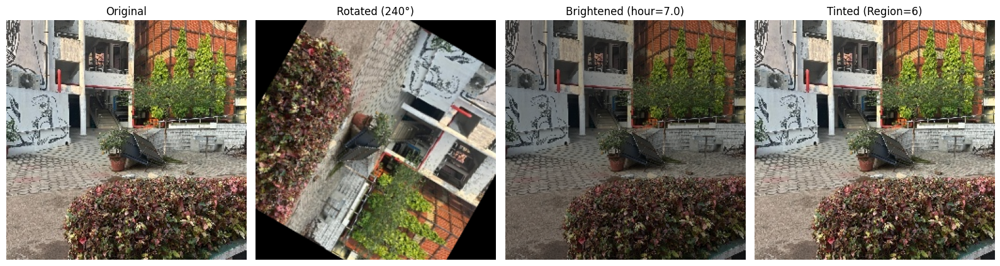

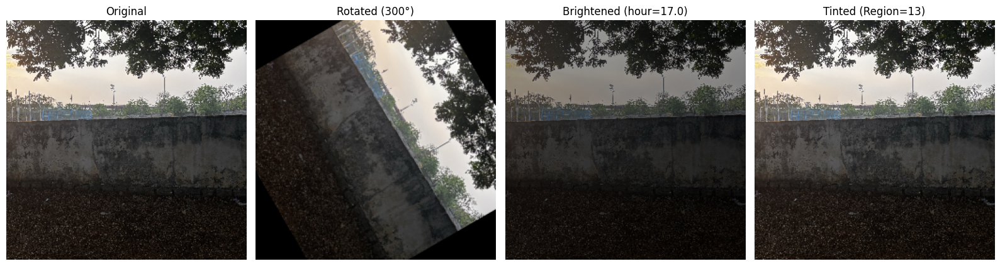

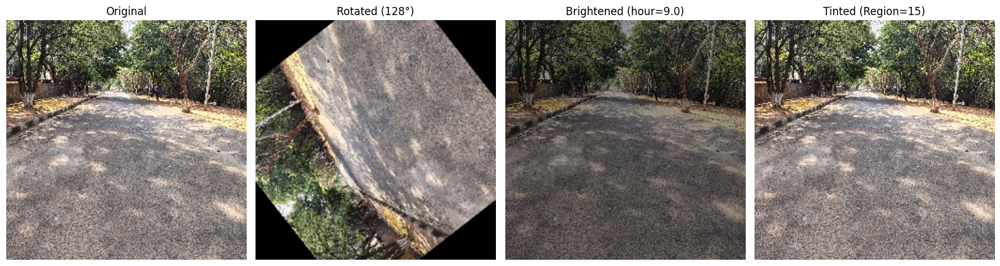

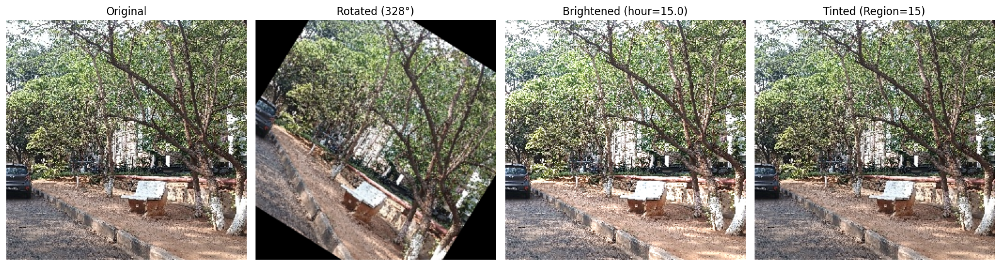

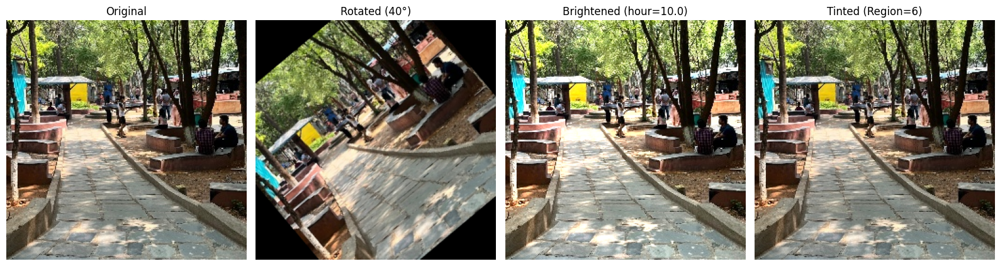

In [47]:
num_to_show = 5  # how many images to visualize
selected = df.sample(num_to_show)

for idx, row in selected.iterrows():
    path = os.path.join(img_folder, row['filename'])
    img = cv2.imread(path)
    if img is None:
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    angle = row['angle']
    hour = row['hour']
    region_id = row['Region_ID']

    # Apply augmentations
    rotated = rotate_image(img, angle)
    bright = change_brightness(img, hour)
    tinted = tint_by_region(img, region_id)

    # Show all
    fig, axes = plt.subplots(1, 4, figsize=(16, 5))
    titles = ['Original', f'Rotated ({angle}°)', f'Brightened (hour={hour})', f'Tinted (Region={region_id})']
    imgs = [img, rotated, bright, tinted]

    for ax, im, title in zip(axes, imgs, titles):
        ax.imshow(im)
        ax.set_title(title)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

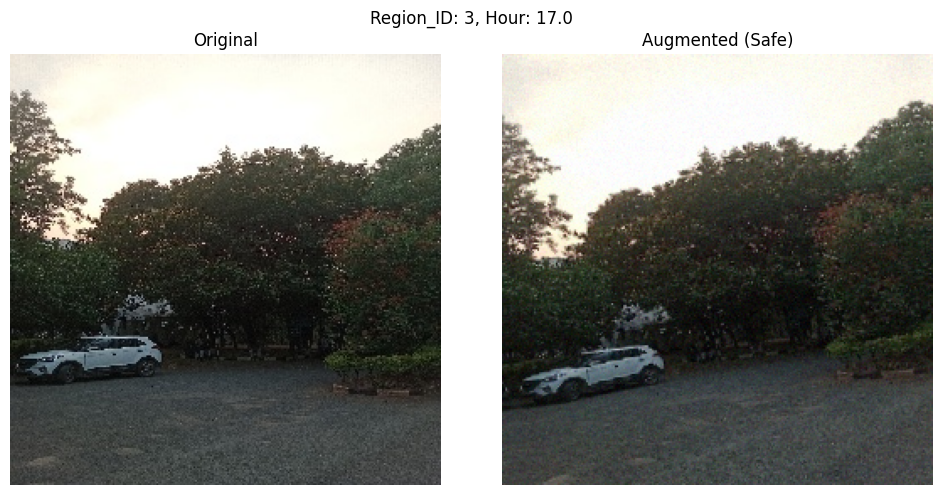

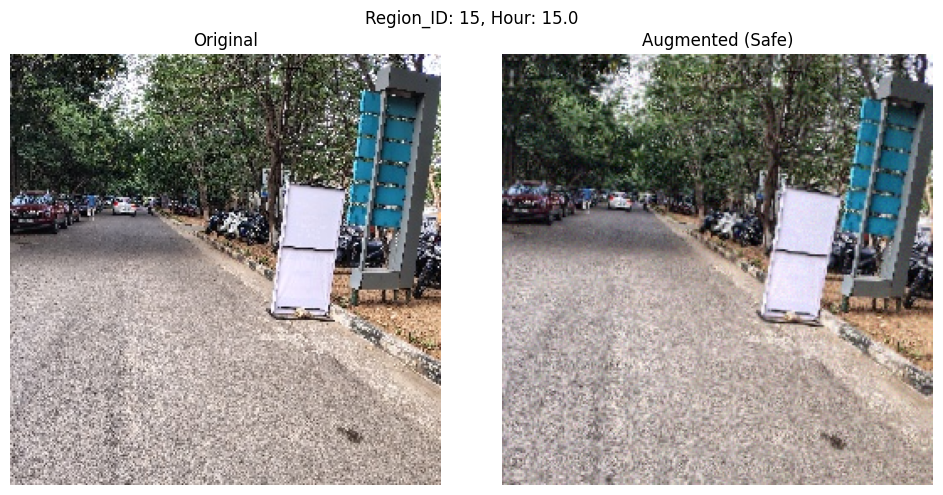

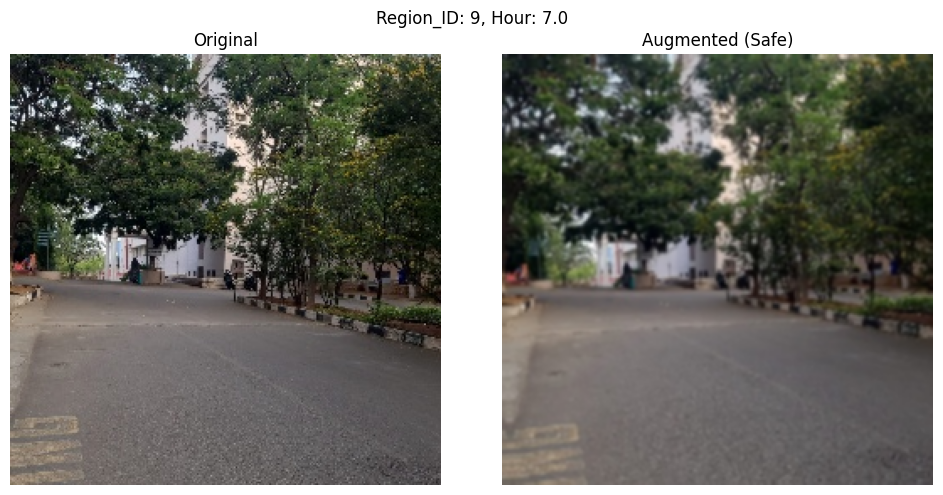

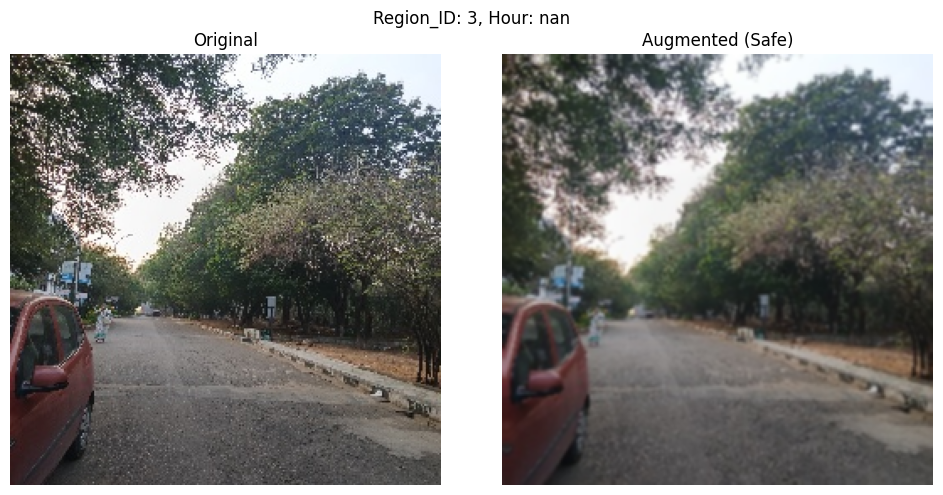

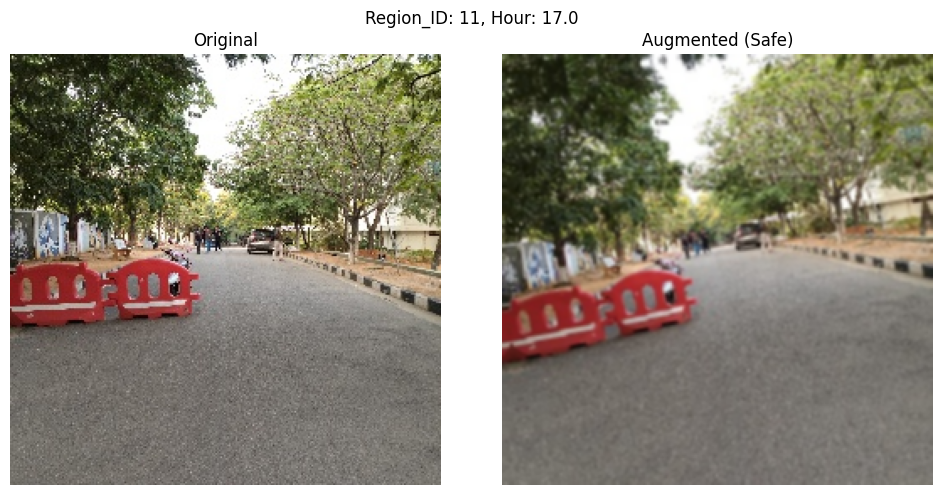

In [ ]:
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import random

# Read CSV
df = pd.read_csv('labels_train_cleaned_latlong.csv')
img_folder = 'images_train'  # Update this to your actual folder

# ---------- AUGMENTATION FUNCTIONS ----------
def rotate_image(image, max_angle=10):
    angle = random.uniform(-max_angle, max_angle)
    h, w = image.shape[:2]
    M = cv2.getRotationMatrix2D((w/2, h/2), angle, 1)
    return cv2.warpAffine(image, M, (w, h), borderMode=cv2.BORDER_REFLECT)

def add_gaussian_noise(image, std=5):
    noise = np.random.normal(0, std, image.shape).astype(np.float32)
    noisy_img = np.clip(image.astype(np.float32) + noise, 0, 255).astype(np.uint8)
    return noisy_img

def apply_blur(image, ksize=3):
    return cv2.GaussianBlur(image, (ksize, ksize), 0)

def safe_augment(image):
    aug = rotate_image(image)
    if random.random() < 0:
        aug = add_gaussian_noise(aug)
    else:
        aug = apply_blur(aug)
    return aug

# ---------- VISUALIZATION LOOP ----------
num_to_show = 5
sampled = df.sample(num_to_show)

for _, row in sampled.iterrows():
    path = os.path.join(img_folder, row['filename'])
    img = cv2.imread(path)
    if img is None:
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    aug_img = safe_augment(img)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(img)
    axes[0].set_title("Original")
    axes[0].axis('off')

    axes[1].imshow(aug_img)
    axes[1].set_title("Augmented (Safe)")
    axes[1].axis('off')

    plt.suptitle(f"Region_ID: {row['Region_ID']}, Hour: {row['hour']}")
    plt.tight_layout()
    plt.show()

In [49]:
df['Region_ID'].value_counts()

Region_ID
15    758
10    537
5     479
4     461
8     454
2     449
6     448
3     440
12    434
11    397
13    395
7     387
1     353
9     262
14    166
Name: count, dtype: int64

In [50]:
import os
import cv2
import pandas as pd
import numpy as np
import random
from tqdm import tqdm

# Load CSV and define paths
df = df
img_folder = 'images_train'  # Update this to your actual folder
aug_folder = 'augmented_images'  # Folder to save augmented images
os.makedirs(aug_folder, exist_ok=True)

# Target image count per region
TARGET_PER_REGION = 1000

# Augmentation functions
def rotate_image(image, max_angle=13):
    angle = random.uniform(-max_angle, max_angle)
    h, w = image.shape[:2]
    M = cv2.getRotationMatrix2D((w/2, h/2), angle, 1)
    return cv2.warpAffine(image, M, (w, h), borderMode=cv2.BORDER_REFLECT)

def add_noise(image, std=3):
    noise = np.random.normal(0, std, image.shape).astype(np.float32)
    return np.clip(image.astype(np.float32) + noise, 0, 255).astype(np.uint8)

def safe_augment(image):
    aug = rotate_image(image)
    if random.random() < 0.5:
        aug = add_noise(aug)
    return aug

# Count current samples per region
region_counts = df['Region_ID'].value_counts().to_dict()
augmented_rows = []

for idx, row in tqdm(df.iterrows(), total=len(df)):
    region = row['Region_ID']
    current_count = region_counts[region]
    aug_per_image = max(0, TARGET_PER_REGION - current_count) // current_count

    img_path = os.path.join(img_folder, row['filename'])
    img = cv2.imread(img_path)
    if img is None:
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    for i in range(aug_per_image):
        aug_img = safe_augment(img)
        new_filename = f"{row['filename'].split('.')[0]}_aug{i}.jpg"
        out_path = os.path.join(aug_folder, new_filename)
        cv2.imwrite(out_path, cv2.cvtColor(aug_img, cv2.COLOR_RGB2BGR))

        # Add to new rows
        new_row = row.copy()
        new_row['filename'] = new_filename
        augmented_rows.append(new_row)

# Update original DataFrame
aug_df = pd.DataFrame(augmented_rows)
combined_df = pd.concat([df, aug_df], ignore_index=True)

# Save the updated CSV
combined_df.to_csv('updated_with_augmented.csv', index=False)

100%|██████████| 6420/6420 [03:00<00:00, 35.61it/s] 


In [56]:
combined_df['Region_ID'].value_counts()

Region_ID
14    996
5     958
4     922
8     908
2     898
6     896
3     880
12    868
11    794
13    790
9     786
7     774
15    758
1     706
10    537
Name: count, dtype: int64

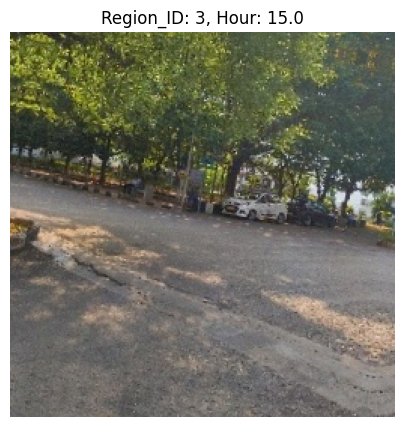

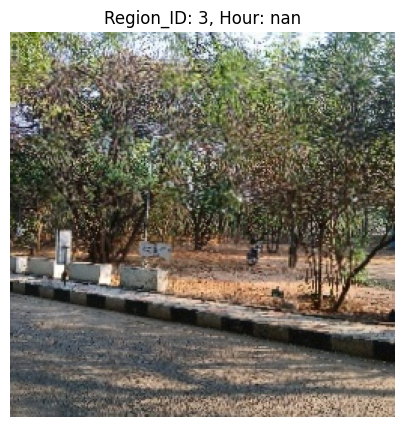

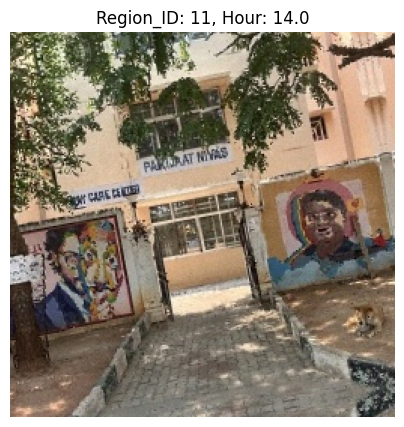

In [62]:
# visualise augmented images
import os
import cv2
import matplotlib.pyplot as plt
import random
import numpy as np
import pandas as pd
from tqdm import tqdm

# Load CSV
df = pd.read_csv('updated_with_augmented.csv')
img_folder = 'images_train_combine'  # Folder with augmented images
num_to_show = 3  # Number of images to visualize
selected = df.sample(num_to_show)
for idx, row in selected.iterrows():
    path = os.path.join(img_folder, row['filename'])
    img = cv2.imread(path)
    if img is None:
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(img)
    ax.set_title(f"Region_ID: {row['Region_ID']}, Hour: {row['hour']}")
    ax.axis('off')
    plt.show()

In [63]:
import os
from PIL import Image

# Set your image directory path here
image_folder = 'images_train_combine'  # e.g., './images/'

# Loop through all files in the directory
for filename in os.listdir(image_folder):
    filepath = os.path.join(image_folder, filename)
    
    try:
        with Image.open(filepath) as img:
            # Get image size and mode
            size = img.size  # (width, height)
            mode = img.mode  # 'RGB', 'L', etc.

            if size != (256, 256) or mode != 'RGB':
                print(f"Invalid image: {filename} | Size: {size} | Mode: {mode}")
    except Exception as e:
        print(f"Error loading {filename}: {e}")

Invalid image: img_2940_aug0.jpg | Size: (720, 720) | Mode: RGB
Invalid image: img_5786_aug4.jpg | Size: (2992, 2992) | Mode: RGB
Invalid image: img_5787_aug4.jpg | Size: (2992, 2992) | Mode: RGB
Invalid image: img_5774_aug3.jpg | Size: (2992, 2992) | Mode: RGB
Invalid image: img_5775_aug3.jpg | Size: (2992, 2992) | Mode: RGB
Invalid image: img_5741_aug1.jpg | Size: (2992, 2992) | Mode: RGB
Invalid image: img_2944.png | Size: (720, 720) | Mode: RGB
Invalid image: img_2950.png | Size: (720, 720) | Mode: RGB
Invalid image: img_5781.jpg | Size: (2992, 2992) | Mode: RGB
Invalid image: img_5742.jpg | Size: (2992, 2992) | Mode: RGB
Invalid image: img_5756.jpg | Size: (2992, 2992) | Mode: RGB
Invalid image: img_5757.jpg | Size: (2992, 2992) | Mode: RGB
Invalid image: img_5743.jpg | Size: (2992, 2992) | Mode: RGB
Invalid image: img_0721.jpeg | Size: (1280, 1280) | Mode: RGB
Invalid image: img_5780.jpg | Size: (2992, 2992) | Mode: RGB
Invalid image: img_0715_aug0.jpg | Size: (1280, 1280) | Mode

In [65]:
import os
from PIL import Image

# Set your image directory path here
image_folder = 'images_train_combine'  # e.g., './images/'
invalid_images = []

# Loop through all files in the directory
for filename in os.listdir(image_folder):
    filepath = os.path.join(image_folder, filename)

    try:
        with Image.open(filepath) as img:
            original_size = img.size
            original_mode = img.mode

            needs_resize = original_size != (256, 256)
            needs_convert = original_mode != 'RGB'

            if needs_resize or needs_convert:
                invalid_images.append((filename, original_size, original_mode))

                # Convert to RGB if needed
                if needs_convert:
                    img = img.convert('RGB')

                # Resize if needed
                if needs_resize:
                    img = img.resize((256, 256), resample=Image.Resampling.LANCZOS)

                # Save the corrected image (overwrite)
                img.save(filepath)

    except Exception as e:
        print(f"Error processing {filename}: {e}")

# Summary of all images that were modified
print("\nModified images:")
for fname, size, mode in invalid_images:
    print(f"{fname} | Size: {size} | Mode: {mode}")


Modified images:
img_2940_aug0.jpg | Size: (720, 720) | Mode: RGB
img_5786_aug4.jpg | Size: (2992, 2992) | Mode: RGB
img_5787_aug4.jpg | Size: (2992, 2992) | Mode: RGB
img_5774_aug3.jpg | Size: (2992, 2992) | Mode: RGB
img_5775_aug3.jpg | Size: (2992, 2992) | Mode: RGB
img_5741_aug1.jpg | Size: (2992, 2992) | Mode: RGB
img_2944.png | Size: (720, 720) | Mode: RGB
img_2950.png | Size: (720, 720) | Mode: RGB
img_5781.jpg | Size: (2992, 2992) | Mode: RGB
img_5742.jpg | Size: (2992, 2992) | Mode: RGB
img_5756.jpg | Size: (2992, 2992) | Mode: RGB
img_5757.jpg | Size: (2992, 2992) | Mode: RGB
img_5743.jpg | Size: (2992, 2992) | Mode: RGB
img_0721.jpeg | Size: (1280, 1280) | Mode: RGB
img_5780.jpg | Size: (2992, 2992) | Mode: RGB
img_0715_aug0.jpg | Size: (1280, 1280) | Mode: RGB
img_0714_aug0.jpg | Size: (1280, 1280) | Mode: RGB
img_2951.png | Size: (720, 720) | Mode: RGB
img_2945.png | Size: (720, 720) | Mode: RGB
img_5741_aug0.jpg | Size: (2992, 2992) | Mode: RGB
img_5775_aug2.jpg | Size: 